In [446]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns;
import xarray as xr
sns.set_style('ticks')
from pathlib import Path
from matplotlib import cm  # For waterfall plot
from matplotlib.ticker import LinearLocator, FormatStrFormatter  # For waterfall plot
from utils import get_plot_df, plot_heatmap_all_polarizations, plot_waterfall_all_polarizations

# Ignore warnings in this notebook
import warnings; warnings.simplefilter('ignore')

# Automatically prints execution time for the individual cells
%load_ext autotime

# Automatically reloads functions defined in external files
%load_ext autoreload
%autoreload 2

# Set xarray to use html as display_style
xr.set_options(display_style="html")

# The path to the project (so absoute file paths can be used throughout the notebook)
PROJ_PATH = Path.cwd().parent

# Define which field polygons should be used for analysis (2017 to 2019 follow the same metadata format)
FIELD_POLYGONS = ['FieldPolygons2017', 'FieldPolygons2018', 'FieldPolygons2019']

# Set seed for random generators
RANDOM_SEED = 42

# Seed the random generators
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
os.environ['PYTHONHASHSEED'] = str(RANDOM_SEED)

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
time: 29.4 ms


In [2]:
netcdf_path = (PROJ_PATH / 'data' / 'processed' / 'FieldPolygons2019_stats').with_suffix('.nc')
ds = xr.open_dataset(netcdf_path, engine="h5netcdf")
ds  # Remember to close the dataset before the netcdf file can be rewritten in cells above

<xarray.Dataset>
Dimensions:         (date: 77, field_id: 52769, polarization: 3)
Coordinates:
  * date            (date) datetime64[ns] 2018-07-08 2018-07-14 ... 2019-10-31
  * field_id        (field_id) int32 61853445 61952339 ... 67365067 67365062
  * polarization    (polarization) object 'VH' 'VV' 'VV-VH'
Data variables:
    afgkode         (field_id) int16 ...
    afgroede        (field_id) object ...
    cvr             (field_id) object ...
    gb              (field_id) float32 ...
    gbanmeldt       (field_id) float32 ...
    imk_areal       (field_id) float32 ...
    journalnr       (field_id) object ...
    marknr          (field_id) object ...
    pass_mode       (date) object ...
    relative_orbit  (date) int16 ...
    satellite       (date) object ...
    stats_max       (field_id, date, polarization) float32 ...
    stats_mean      (field_id, date, polarization) float32 ...
    stats_median    (field_id, date, polarization) float32 ...
    stats_min       (field_id, date, polarization) float32 ...
    stats_std       (field_id, date, polarization) float32 ...

time: 195 ms


In [3]:
ds.close()

time: 20.5 ms


In [4]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2019-01-01', '2019-01-31'), 
                 fields='all', 
                 satellite='all', 
                 polarization='VV',
                 crop_type='all',
                 netcdf_path=netcdf_path)

ALL_CROP_TYPES = df['afgroede'].unique()
print(ALL_CROP_TYPES)

['Kartofler, stivelses-' 'Kartofler, lægge- (egen opformering)'
 'Kartofler, andre' 'Kartofler, spise-'
 'Kartofler, lægge- (certificerede)' 'Vårbyg' 'Vinterbyg' 'Vårhvede'
 'Vinterhvede' 'Vinterrug' 'Vårhavre' 'Silomajs' 'Vinterraps'
 'Permanent græs, normalt udbytte' 'Pil' 'Skovdrift, alm.']
time: 2.03 s


Types of pass-mode: ['DSC']


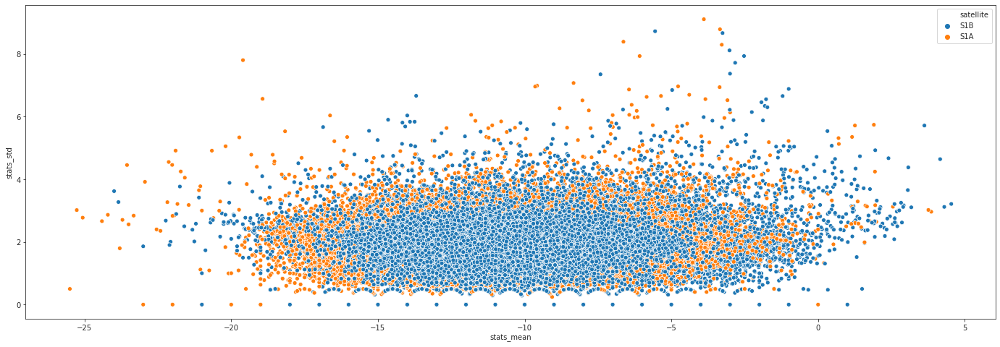

time: 27.2 s


In [5]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2019-01-01', '2019-03-31'), 
                 fields='all', 
                 satellite='all', 
                 polarization='VV',
                 netcdf_path=netcdf_path)

print("Types of pass-mode: {}".format(df['pass_mode'].unique()))

plt.figure(figsize=(24, 8))
ax = sns.scatterplot(x='stats_mean', y='stats_std', hue='satellite', data=df)

<Figure size 1728x1728 with 0 Axes>

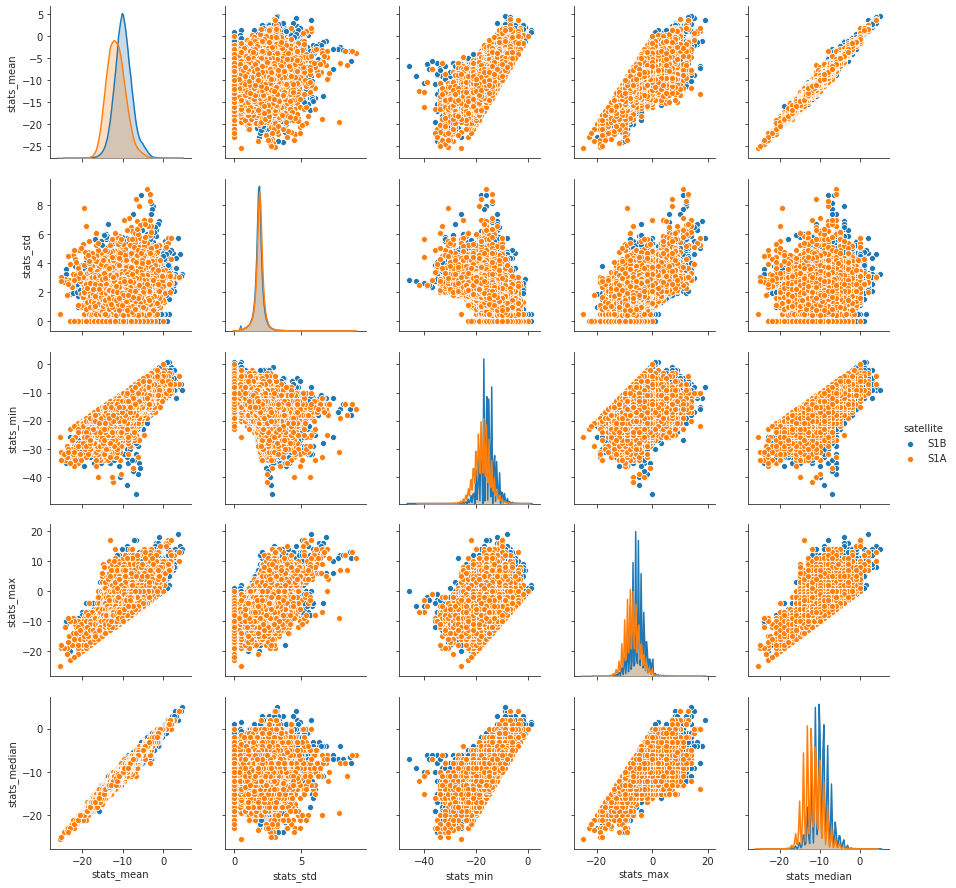

time: 1min 59s


In [6]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2019-01-01', '2019-03-31'), 
                 fields='all', 
                 satellite='all', 
                 polarization='VV',
                 netcdf_path=netcdf_path)

df = df[['satellite', 'stats_mean', 'stats_std', 'stats_min', 'stats_max', 'stats_median']]
plt.figure(figsize=(24, 24))
ax = sns.pairplot(df, hue='satellite')

<Figure size 1728x1728 with 0 Axes>

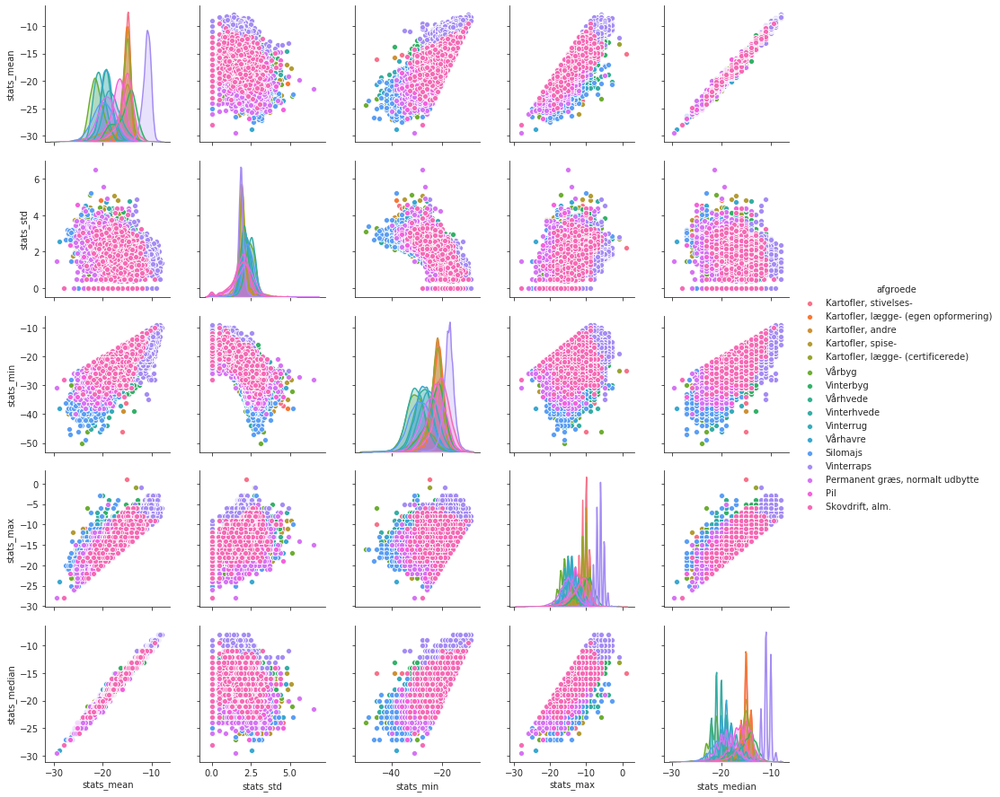

time: 21.5 s


In [7]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2019-06-20', '2019-06-22'), 
                 fields='all', 
                 satellite='all', 
                 polarization='VH',
                 netcdf_path=netcdf_path)

df = df[['afgroede', 'stats_mean', 'stats_std', 'stats_min', 'stats_max', 'stats_median']]
plt.figure(figsize=(24, 24))
ax = sns.pairplot(df, hue='afgroede')

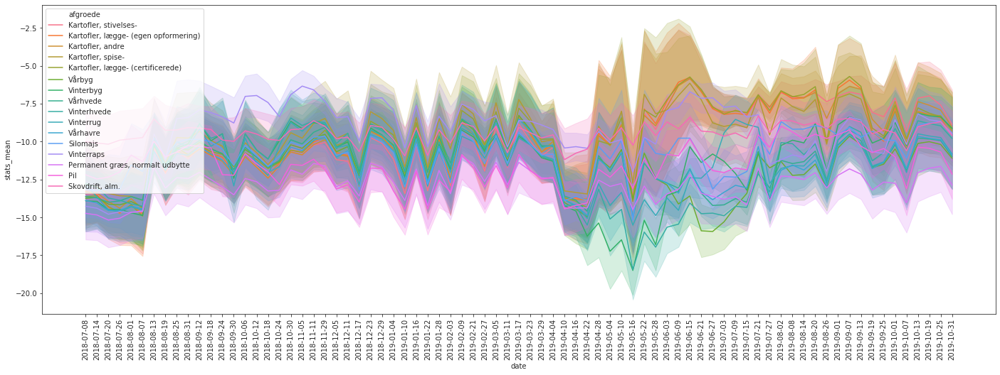

time: 47.1 s


In [8]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2018-01-01', '2019-12-31'), 
                 fields='all',#range(100), 
                 satellite='all', 
                 polarization='VV',
                 netcdf_path=netcdf_path)

plt.figure(figsize=(24, 8))
plt.xticks(rotation=90, horizontalalignment='center')
ax = sns.lineplot(x='date', y='stats_mean', hue='afgroede', data=df, ci='sd')

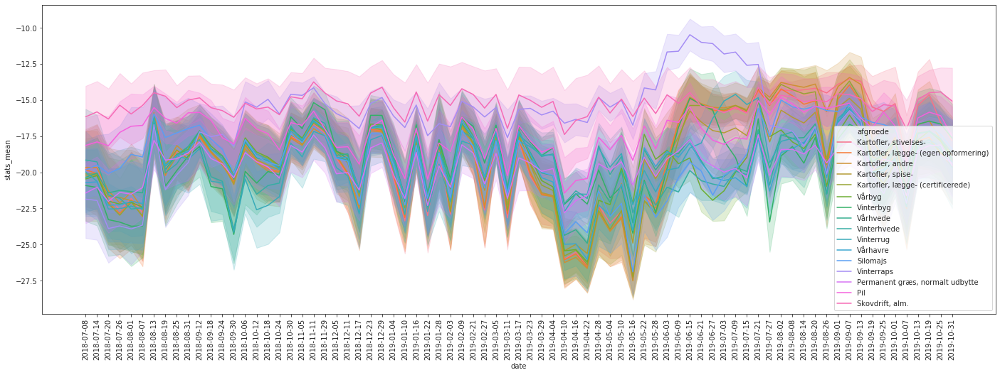

time: 47.1 s


In [9]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2018-01-01', '2019-12-31'), 
                 fields='all',#range(100), 
                 satellite='all', 
                 polarization='VH',
                 netcdf_path=netcdf_path)

plt.figure(figsize=(24, 8))
plt.xticks(rotation=90, horizontalalignment='center')
ax = sns.lineplot(x='date', y='stats_mean', hue='afgroede', data=df, ci='sd')

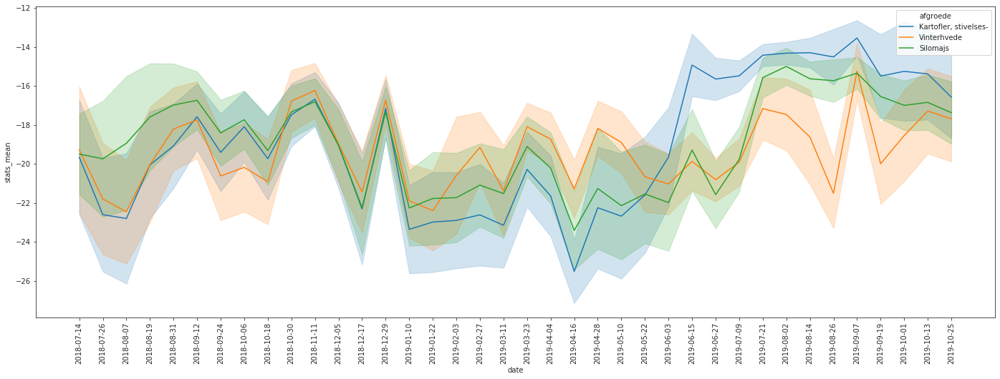

time: 17.9 s


In [10]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2018-01-01', '2019-12-31'), 
                 fields='all',#range(100), 
                 satellite='S1A', 
                 polarization='VH',
                 netcdf_path=netcdf_path)

df = df[df['afgroede'].isin(['Silomajs', 'Vinterhvede', 'Kartofler, stivelses-'])]
plt.figure(figsize=(24, 8))
plt.xticks(rotation=90, horizontalalignment='center')
ax = sns.lineplot(x='date', y='stats_mean', hue='afgroede', data=df, ci='sd')

Plotting Kartofler, stivelses-
Plotting Kartofler, lægge- (egen opformering)
Plotting Kartofler, andre
Plotting Kartofler, spise-
Plotting Kartofler, lægge- (certificerede)
Plotting Vårbyg
Plotting Vinterbyg
Plotting Vårhvede
Plotting Vinterhvede
Plotting Vinterrug
Plotting Vårhavre
Plotting Silomajs
Plotting Vinterraps
Plotting Permanent græs, normalt udbytte
Plotting Pil
Plotting Skovdrift, alm.


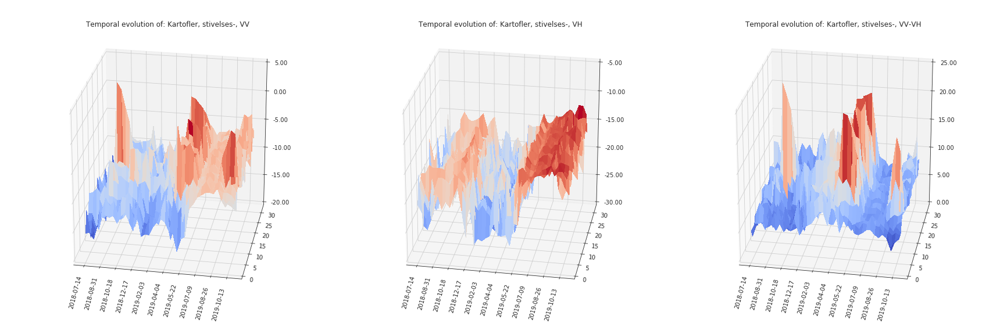

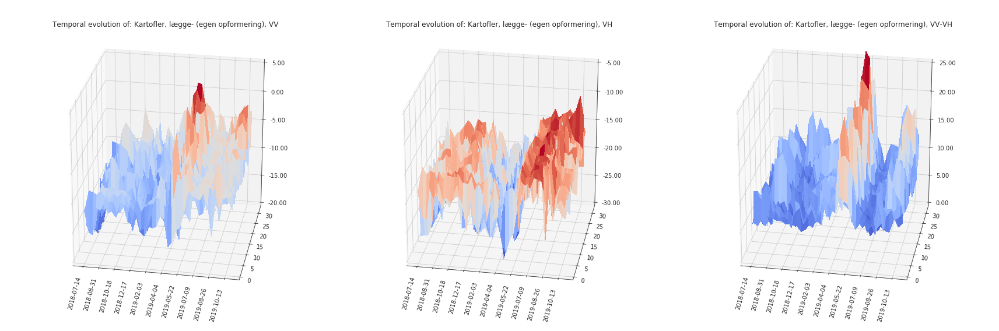

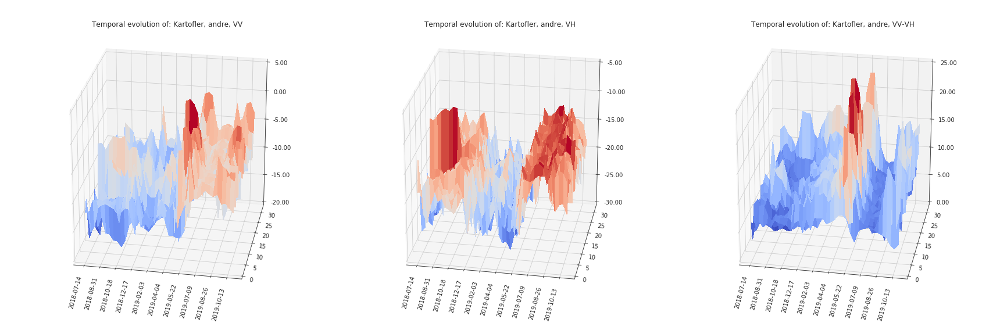

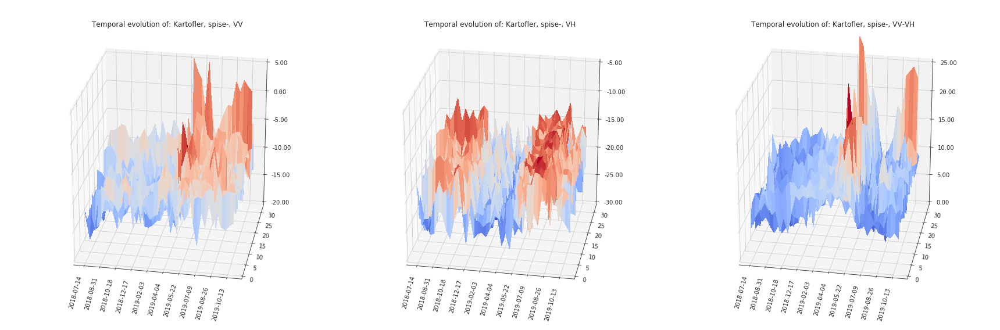

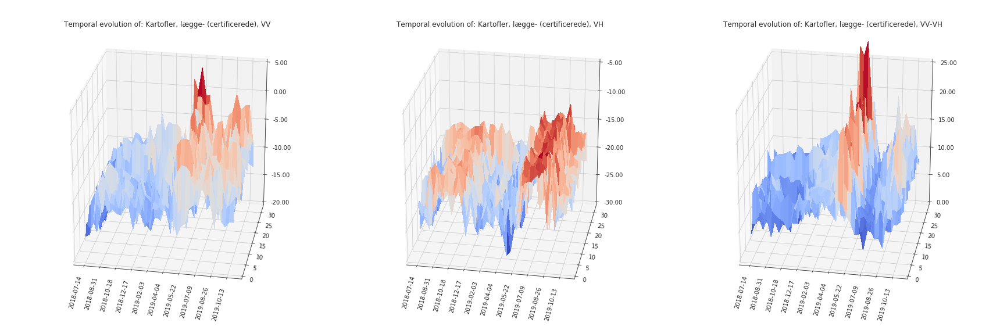

...

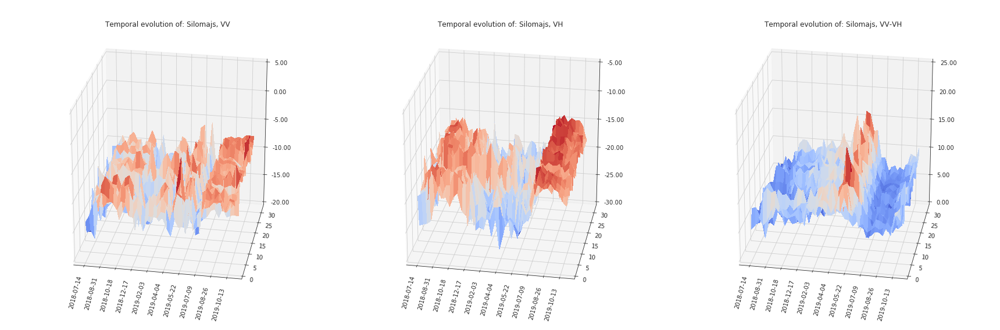

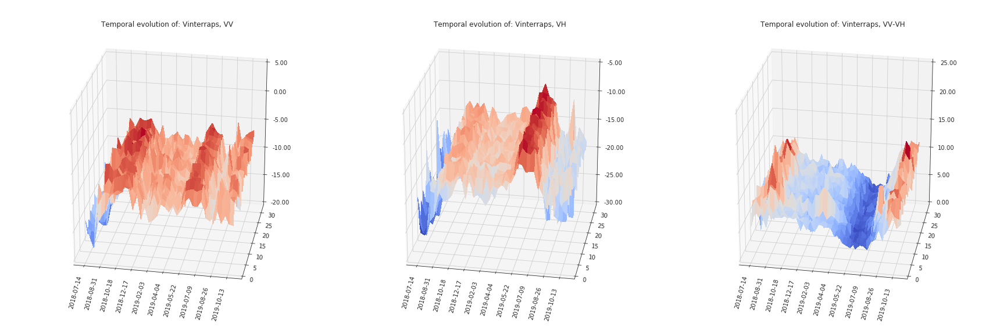

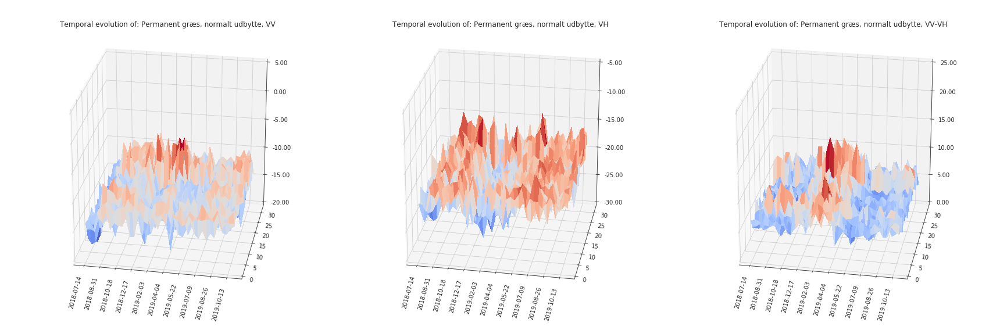

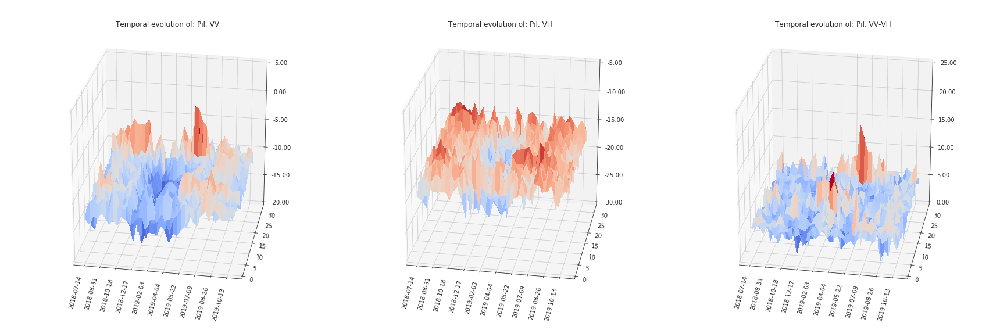

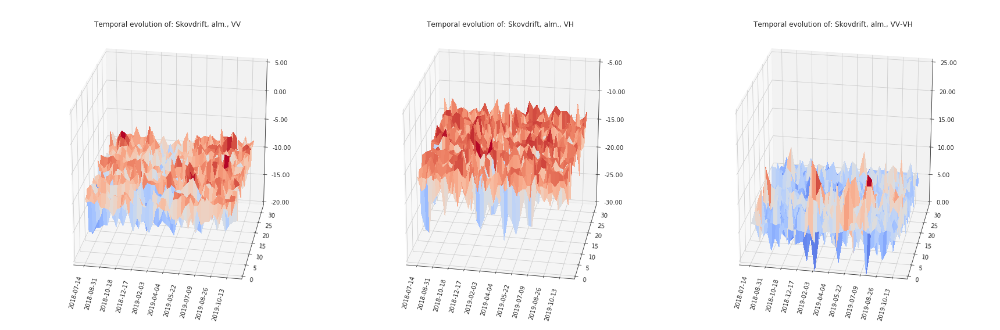

time: 3min 26s


In [11]:
for crop_type in ALL_CROP_TYPES:
    print(f"Plotting {crop_type}")
    plot_waterfall_all_polarizations(crop_type=crop_type, 
                                     satellite_dates=slice('2018-01-01', '2019-12-31'), 
                                     num_fields=32, 
                                     satellite='S1A', 
                                     sort_rows=False, 
                                     netcdf_path=netcdf_path)

Plotting Kartofler, stivelses-
Plotting Kartofler, lægge- (egen opformering)
Plotting Kartofler, andre
Plotting Kartofler, spise-
Plotting Kartofler, lægge- (certificerede)
Plotting Vårbyg
Plotting Vinterbyg
Plotting Vårhvede
Plotting Vinterhvede
Plotting Vinterrug
Plotting Vårhavre
Plotting Silomajs
Plotting Vinterraps
Plotting Permanent græs, normalt udbytte
Plotting Pil
Plotting Skovdrift, alm.


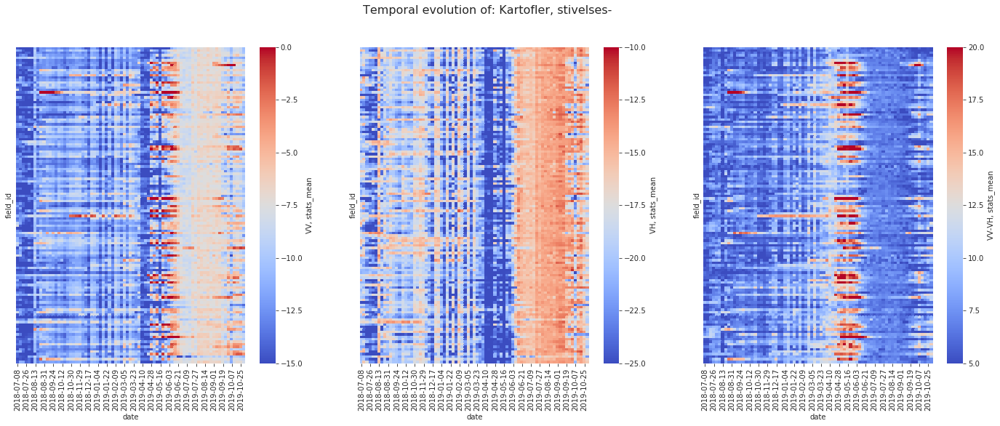

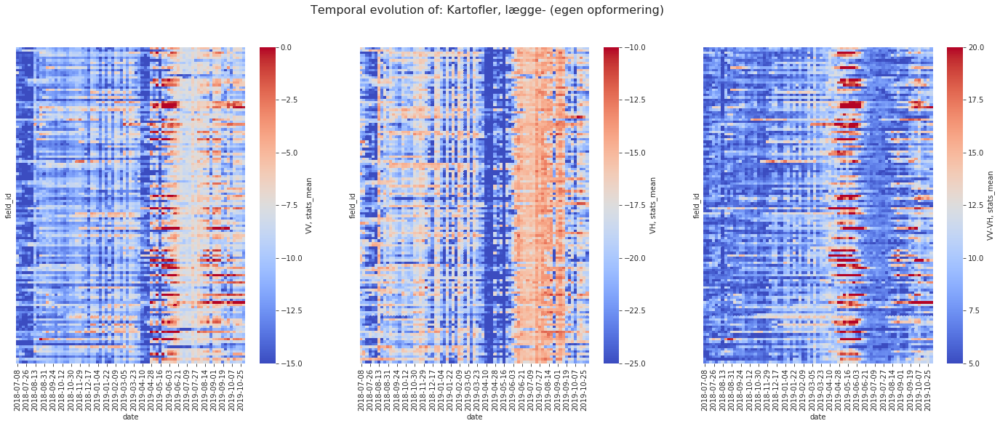

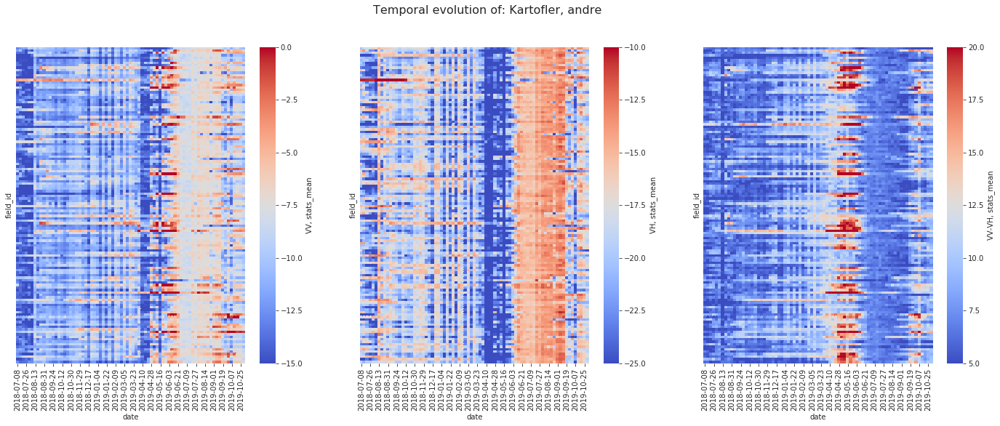

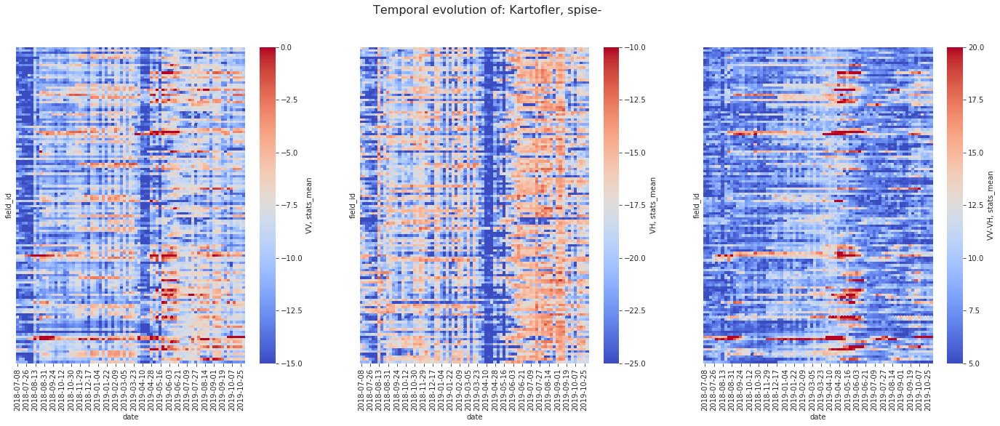

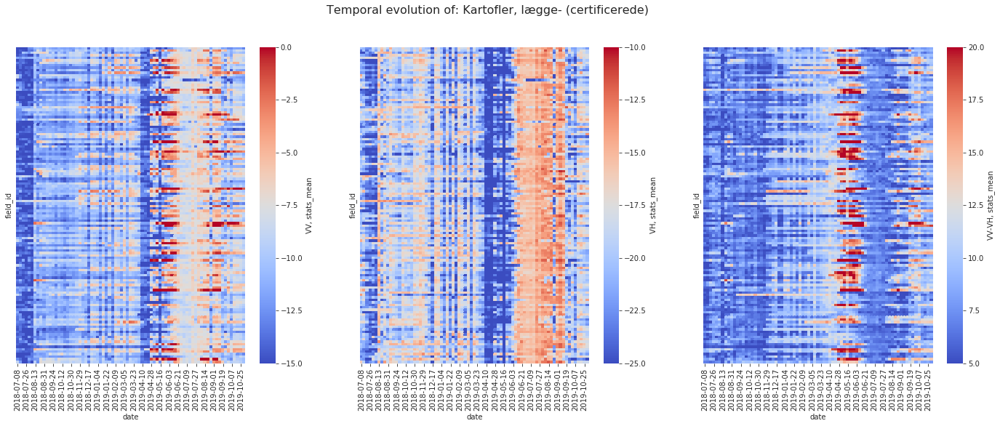

...

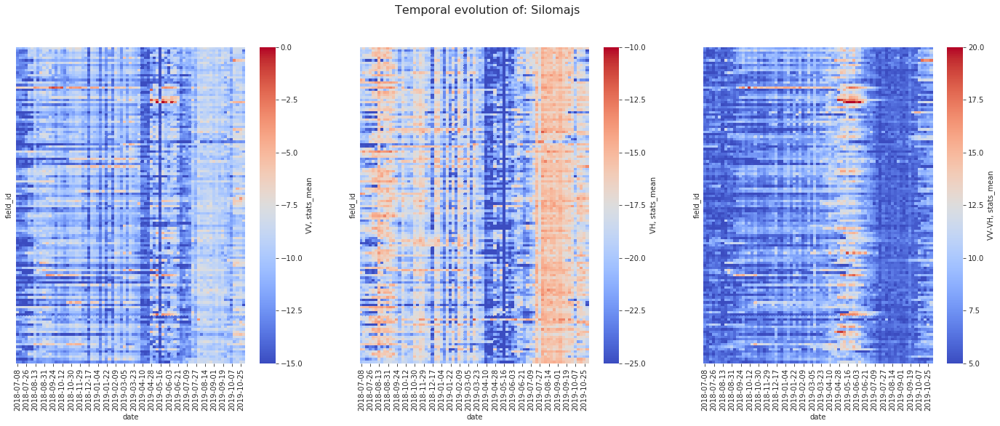

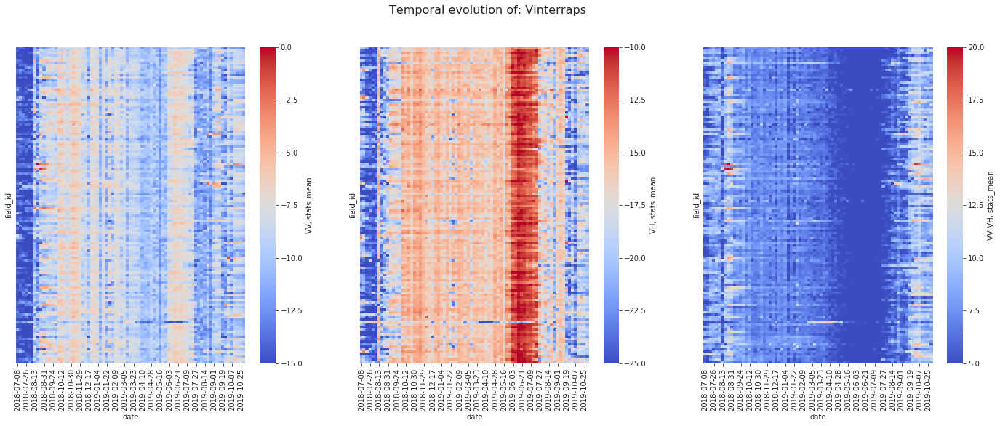

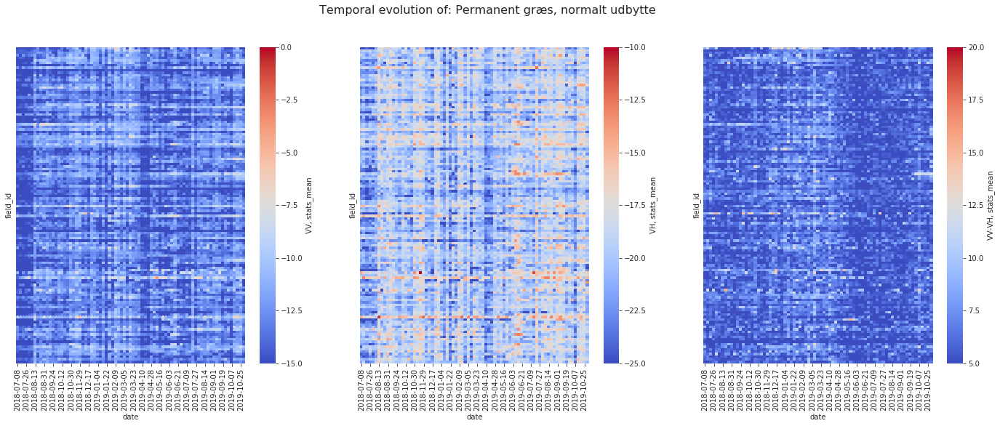

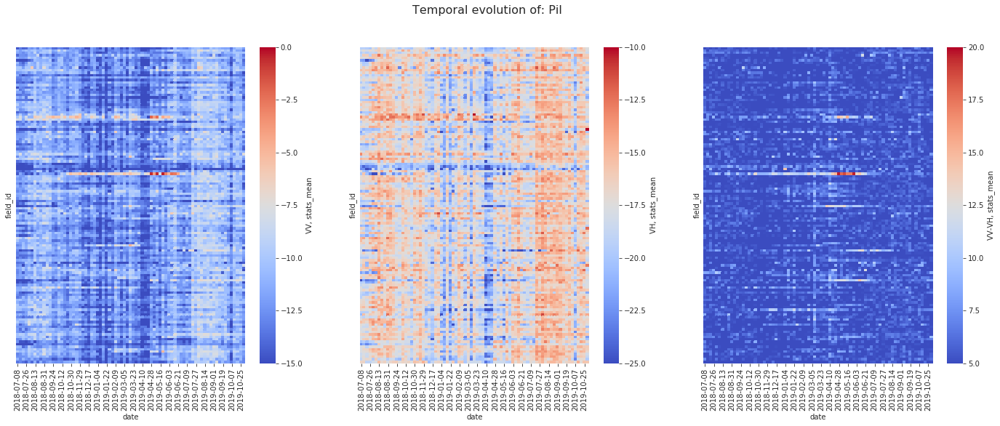

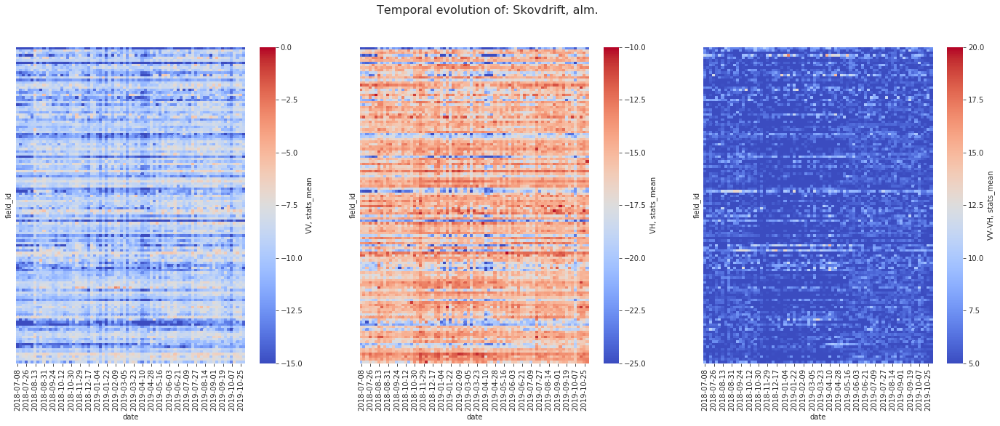

time: 4min 39s


In [12]:
for crop_type in ALL_CROP_TYPES:  
    print(f"Plotting {crop_type}")
    plot_heatmap_all_polarizations(crop_type=crop_type,
                                   satellite_dates=slice('2018-01-01', '2019-12-31'),
                                   num_fields=128, 
                                   satellite='all', 
                                   netcdf_path=netcdf_path)

In [13]:
# Idea for violin plot: Use it to compare individual dates on the x-axis. 
# For instance have 5 dates and 2 crop types, and then use x=dates, y=stats-mean, hue=afgroede. 
# This would give you a comparison of the distributions for two crop types for five different dates. 
# That might be useful.

time: 21.2 ms


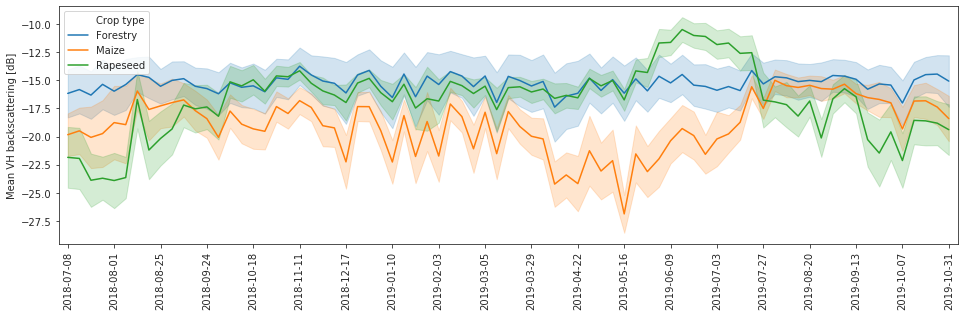

time: 31.2 s


In [445]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2018-07-01', '2019-11-01'), 
                 fields='all',#range(100), 
                 satellite='all', 
                 polarization='VH',
                 netcdf_path=netcdf_path)

df = df[df['afgroede'].isin(['Skovdrift, alm.', 'Silomajs', 'Vinterraps'])]
df = df.rename(columns={'afgroede': 'Crop type'})
df.loc[df['Crop type'] == 'Skovdrift, alm.', 'Crop type'] = 'Forestry'
df.loc[df['Crop type'] == 'Silomajs', 'Crop type'] = 'Maize'
df.loc[df['Crop type'] == 'Vinterraps', 'Crop type'] = 'Rapeseed'

plt.figure(figsize=(13.5, 4.5))
plt.xticks(rotation=90, horizontalalignment='center')
ax = sns.lineplot(x='date', y='stats_mean', hue='Crop type', hue_order=['Forestry', 'Maize', 'Rapeseed'], 
                  data=df.sort_index(ascending=False), ci='sd')
ax.set_ylabel('Mean VH backscattering [dB]')
ax.set_xlabel('')
#ax.set_ylim(-29, -9)
ax.margins(x=0.01)

# Only show every n'th tick on the x-axis
ticks_divider = 4
dates = df['date'].unique()
num_dates = len(dates)
xticks = range(0, num_dates)[::ticks_divider] 
xticklabels = dates[::ticks_divider]
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, rotation=90, horizontalalignment='center')

# Save the figure
save_path = PROJ_PATH / 'reports' / 'figures' / 'TemporalVariationOverview.pdf'
plt.tight_layout()
plt.savefig(save_path)

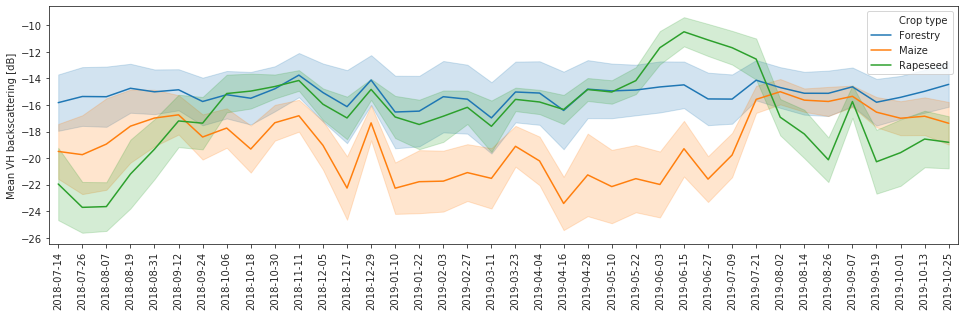

time: 17.5 s


In [444]:
df = get_plot_df(polygons_year=2019, 
                 satellite_dates=slice('2018-07-01', '2019-11-01'), 
                 fields='all',#range(100), 
                 satellite='S1A', 
                 polarization='VH',
                 netcdf_path=netcdf_path)

df = df[df['afgroede'].isin(['Skovdrift, alm.', 'Silomajs', 'Vinterraps'])]
df = df.rename(columns={'afgroede': 'Crop type'})
df.loc[df['Crop type'] == 'Skovdrift, alm.', 'Crop type'] = 'Forestry'
df.loc[df['Crop type'] == 'Silomajs', 'Crop type'] = 'Maize'
df.loc[df['Crop type'] == 'Vinterraps', 'Crop type'] = 'Rapeseed'

plt.figure(figsize=(13.5, 4.5))
plt.xticks(rotation=90, horizontalalignment='center')
ax = sns.lineplot(x='date', y='stats_mean', hue='Crop type', hue_order=['Forestry', 'Maize', 'Rapeseed'], 
                  data=df.sort_index(ascending=False), ci='sd')
ax.set_ylabel('Mean VH backscattering [dB]')
ax.set_xlabel('')
#ax.set_ylim(-29, -9)
ax.margins(x=0.01)

# Only show every n'th tick on the x-axis
ticks_divider = 1
dates = df['date'].unique()
num_dates = len(dates)
xticks = range(0, num_dates)[::ticks_divider] 
xticklabels = dates[::ticks_divider]
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels, rotation=90, horizontalalignment='center')

# Save the figure
save_path = PROJ_PATH / 'reports' / 'figures' / 'TemporalVariationOverview_S1A.pdf'
plt.tight_layout()
plt.savefig(save_path)

In [455]:
def plot_and_save_waterfall(crop_type, crop_name, save_path, fontsize=12):
    df = get_plot_df(polygons_year=2019, 
                     satellite_dates=slice('2018-07-01', '2019-11-01'), 
                     fields='all',#range(100), 
                     satellite='all', 
                     crop_type=crop_type,
                     polarization='VH',
                     netcdf_path=netcdf_path)

    df = df.dropna()

    # Get the dates (needed later for plotting)
    num_fields = 32
    dates = df['date'].unique()
    num_dates = len(dates)
    sort_rows = False

    # Pivot the df (https://stackoverflow.com/a/37790707/12045808)
    df = df.pivot(index='field_id', columns='date', values='stats_mean')

    # Drop fields having any date with a nan value, and pick num_fields from the remainder
    df = df.dropna().sample(n=num_fields, random_state=1)

    if sort_rows:
        # Sort by sum of each row
        df = df.reset_index()
        df = df.drop(columns=['field_id'])
        idx = df.sum(axis=1).sort_values(ascending=False).index
        df = df.iloc[idx]

    # Get the min and max values depending on polarization
    vmin_cm, vmax_cm = -25, -10
    vmin_z, vmax_z = -30, -5

    # Make data.
    x = np.linspace(1, num_dates, num_dates)  # Dates
    y = np.linspace(1, num_fields, num_fields)  # Fields
    X,Y = np.meshgrid(x, y)
    Z = df.to_numpy()

    # Plot the surface.
    fig = plt.figure(figsize=(7, 7))
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm, vmin=vmin_cm, vmax=vmax_cm,
                           linewidth=0, antialiased=False)

    # Set title 
    ax.set_title(f"Temporal evolution of {crop_name}", fontsize=fontsize+2)

    # Set angle (https://stackoverflow.com/a/47610615/12045808)
    ax.view_init(25, 280)

    # Add a color bar which maps values to colors.
    #fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10)

    # Customize the z axis (backscattering value)
    ax.zaxis.set_major_locator(LinearLocator(6))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.set_zlim(vmin_z, vmax_z)
    for tick in ax.zaxis.get_major_ticks():
        tick.label1.set_horizontalalignment('left')
        tick.label1.set_fontsize(fontsize) 

    # Customize the x axis (dates)
    # If >10 dates, skip every second tick, if >20 dates, skip every third ... 
    ticks_divider = int(np.ceil(num_dates/10))  
    xticks = range(1, num_dates+1)[::ticks_divider]  # Array must be starting at 1
    xticklabels = dates[::ticks_divider]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, rotation=75, horizontalalignment='right')

    # Customize the y axis (field ids)
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_horizontalalignment('left')
        tick.label1.set_verticalalignment('bottom')
        tick.label1.set_rotation(-5)

    # Set viewing distance (important to not cut off labels)
    ax.dist = 11

    # Set labels (the spaces are a hacky way to get the labels to be at the correct position)
    ax.set_ylabel('              Field', labelpad=18, fontsize=fontsize)
    ax.set_zlabel('Mean VH backscattering [dB]         ', labelpad=44, fontsize=fontsize)
    
    # Set tick size
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    #plt.zticks(fontsize=fontsize)
    
    # Save figure
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

time: 27.6 ms


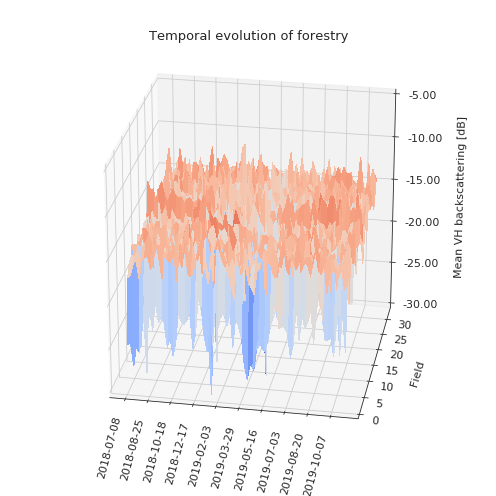

time: 4.19 s


In [456]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'WaterfallForestry.pdf'
plot_and_save_waterfall('Skovdrift, alm.', 'forestry', save_path, fontsize=11)

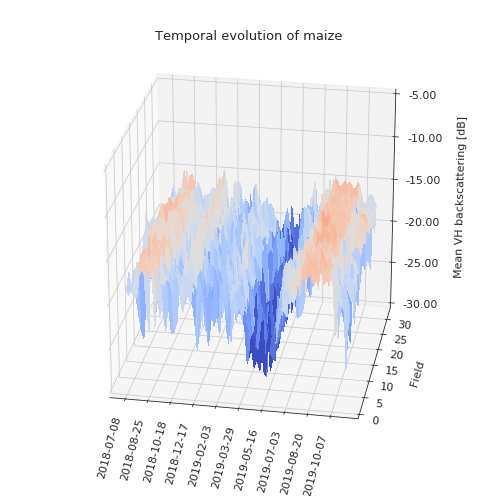

time: 6.03 s


In [457]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'WaterfallMaize.pdf'
plot_and_save_waterfall('Silomajs', 'maize', save_path, fontsize=11)

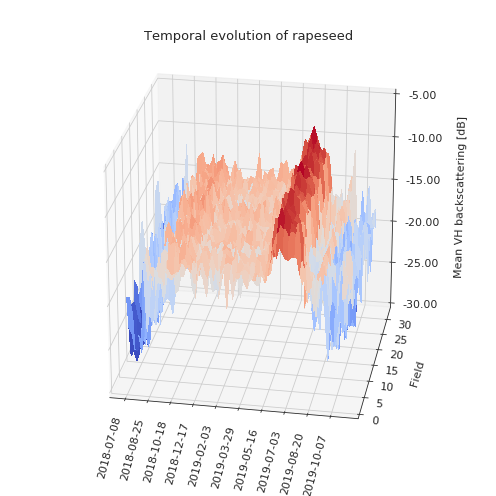

time: 6.07 s


In [458]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'WaterfallRapeseed.pdf'
plot_and_save_waterfall('Vinterraps', 'rapeseed', save_path, fontsize=11)

In [502]:
def plot_and_save_heatmap(crop_type, crop_name, save_path, fontsize=12):
    fig = plt.figure(figsize=(4, 5))
    
    df = get_plot_df(polygons_year=2019, 
                     satellite_dates=slice('2018-07-01', '2019-11-01'), 
                     fields='all',#range(100), 
                     satellite='all', 
                     crop_type=crop_type,
                     polarization='VH',
                     netcdf_path=netcdf_path)

    # Get the dates (needed later for plotting)
    num_fields = 128
    dates = df['date'].unique()
    num_dates = len(dates)
    sort_rows = False
    
    # Pivot the df (https://stackoverflow.com/a/37790707/12045808)
    df = df.pivot(index='field_id', columns='date', values='stats_mean')

    # Drop fields having any date with a nan value, and pick num_fields from the remainder
    df = df.dropna()
    if num_fields > df.shape[0]:
        num_fields = df.shape[0]
        print(f"Only {num_fields} fields were available for plotting")
    df = df.sample(n=num_fields, random_state=1)

    if sort_rows:
        # Sort by sum of each row
        df = df.reset_index()
        df = df.drop(columns=['Field'])
        idx = df.sum(axis=1).sort_values(ascending=False).index
        df = df.iloc[idx]

    # Get the min and max values depending on polarization
    vmin, vmax = -25, -10 

    ax = sns.heatmap(df, linewidths=0, linecolor=None, vmin=vmin, vmax=vmax, yticklabels=False, 
                     cmap=cm.coolwarm)
    
    # Pad label for cbar (https://stackoverflow.com/questions/52205416/moving-label-of-seaborn-colour-bar)
    cbar = ax.collections[0].colorbar
    cbar.set_label('Mean VH backscattering [dB]', labelpad=10, fontsize=fontsize)
    
    # Customize the x axis (dates)
    ticks_divider = 15
    xticks = range(1, num_dates+1)[::ticks_divider]
    xticklabels = dates[::ticks_divider]
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels, rotation=90, horizontalalignment='center', fontsize=fontsize)
    
    # Fix labels
    ax.set_xlabel('')
    ax.set_ylabel('Field', fontsize=fontsize)
    cbar.ax.tick_params(labelsize=fontsize)
    fig = ax.get_figure()
    
    # Save figure
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

time: 29.7 ms


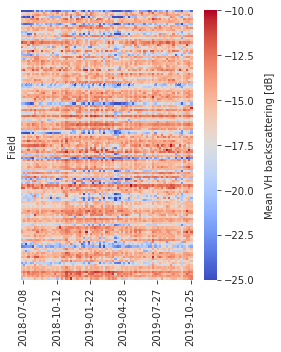

time: 5.2 s


In [504]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'HeatmapForestry.pdf'
plot_and_save_heatmap('Skovdrift, alm.', 'forestry', save_path, fontsize=10)

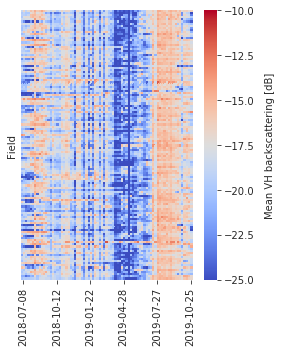

time: 6.94 s


In [505]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'HeatmapMaize.pdf'
plot_and_save_heatmap('Silomajs', 'maize', save_path, fontsize=10)

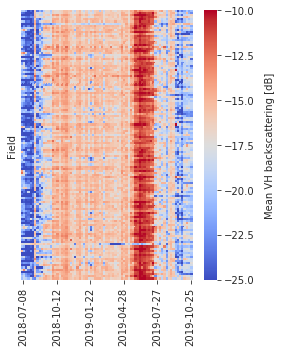

time: 7.06 s


In [506]:
save_path = PROJ_PATH / 'reports' / 'figures' / 'HeatmapRapeseed.pdf'
plot_and_save_heatmap('Vinterraps', 'rapeseed', save_path, fontsize=10)